# **Analyzing Customer Sentiment Before and After the Launch of Apple's New VR Headset: Apple Visions Pro.**

## Data Collection and Cleaning

Used the following resources to collect data relevant to our topic.


1.   Twitter - Gathered 12,000+ tweets between the announcement date of the Apple Vision Pro's (June 5, 2023) and Post-Release of the Apple Vision Pro's (Feb 17, 2024)
2.   Youtube - Video Transcripts of 13 AVP Review videos before and after release date.
3.   Google news - articles of 50  reviews before and after the release date.



Key Dates:


*   June 5, 2023 - Apple Vision Pro Announcement
*   February 2, 2024 - Apple Vision Pro Official Release Date
*   February 17, 2024 - Cutoff Date for Tweets and Youtube Data Collection



### Tweet Extractor Code:

To do this, we needed to create a Twitter Scraping bot that used Mozilla FireFox to search, filter, and record tweets between the start_date and end_date for our topic.

Dependencies:


1.   Selenium and Selenium Webdriver (Instructions can be found [here](https://selenium-python.readthedocs.io/installation.html)
2.   Firefox Driver called GeckoDriver. Download link can be found [here](https://github.com/mozilla/geckodriver/releases)



WARNING: DO NOT RUN THIS CODE WITHOUT DEPENDENCIES INSTALLED.

In [ ]:
from selenium import webdriver
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.firefox.service import Service
from selenium.webdriver.common.by import By
import datetime
import csv
import time

In [ ]:
# Define the start and end dates
start_date = datetime.date(2024, 2, 15)
end_date = datetime.date(2024, 2, 17)

instructions = []

# Generate instructions for each day from start_date to end_date
current_date = start_date
while current_date <= end_date:
    instruction = f"Apple Vision Pro lang:en until:{current_date + datetime.timedelta(days=1)} since:{current_date} -filter:links -filter:replies"
    instructions.append(instruction)
    current_date += datetime.timedelta(days=2)

SCROLLS = 20
tweet_texts = []

# Scroll to the bottom of the page to load more tweets
def scroll_to_bottom(driver):
    driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
    time.sleep(2)  # Adjust sleep time as needed

# CHANGE THIS TO WHEREVER YOU STORED GECKODRIVER
# Path to your GeckoDriver executable
service = Service(executable_path='/Users/ivanzubkov/Downloads/geckodriver')

# Initialize Firefox WebDriver with options
options = webdriver.FirefoxOptions()

# CHANGE THIS TO WHEREVER YOUR FIREFOX PROFILE IS STORED
# Add profile option to use an existing user session
options.profile = '/Users/ivanzubkov/Library/Application Support/Firefox/Profiles/pckh4yvc.default-release'

# Instantiate Firefox WebDriver with options
driver = webdriver.Firefox(service=service, options=options)

# Navigate to Twitter
driver.get("https://twitter.com")

# Sleep for a while to ensure the page loads completely
time.sleep(5)

# Loop through each instruction
for instruction in instructions:
    # Locate the search input field by name
    search_bar = driver.find_element(By.CSS_SELECTOR, "input[placeholder='Search']")
    time.sleep(1)
    # Clear the search bar
    search_bar.clear()
    time.sleep(1)
    # Enter the current instruction or search query
    search_bar.send_keys(instruction)

    # Hit Enter to initiate the search
    search_bar.send_keys(Keys.RETURN)

    time.sleep(5)

    # Locate tweet elements
    tweet_elements = driver.find_elements(By.XPATH, '//div[@data-testid="cellInnerDiv"]')

    # Scroll to the bottom multiple times to load more tweets
    for _ in range(SCROLLS):  # You may adjust the number of scrolls based on your needs
        scroll_to_bottom(driver)

        # Wait for new tweets to load
        time.sleep(3)  # Adjust sleep time as needed

        # Find newly loaded tweet elements
        new_tweet_elements = driver.find_elements(By.XPATH, '//div[@data-testid="cellInnerDiv"]')

        # Extract tweet text from newly loaded elements
        for new_tweet_element in new_tweet_elements:
            tweet_text = new_tweet_element.text
            tweet_texts.append(tweet_text)

'''
# Define the CSV file path
csv_file_path = 'tweet_texts_new.csv'

# Write tweet texts to a CSV file
with open(csv_file_path, mode='a', newline='', encoding='utf-8') as file:
    writer = csv.writer(file)
    if file.tell() == 0:  # If file is empty, write header
        writer.writerow(['Tweet Text'])
    for tweet_text in tweet_texts:
        writer.writerow([tweet_text])

print(f"Tweet texts have been exported to {csv_file_path}")
'''
# Close the browser session when done
driver.quit()

Twitter's anti-bot system regularly catches attempts of webscraping and times the user out of the system. For us, this occurred every 1500 tweets. After waiting for about 5-10 minutes, we are able to start scraping again. Using this next block of code, we can identify when and where this timeout message appears during the automated scraping and end the user session. We then deleted text AFTER the error message occcurs, and restarted the scraping from this new checkpoint.

In [ ]:
content_to_search = "Something went wrong. Try reloading.\nRetry"

# Search for the content in the list
matching_indices = [index for index, text in enumerate(tweet_texts) if content_to_search in text]

if matching_indices:
    print("Indices of matching content:", matching_indices)
    # If you want to get the first matching index
    first_matching_index = matching_indices[0]
    print("First matching index:", first_matching_index)
else:
    print("Content not found in the list")

In [ ]:
# This APPENDS our tweets to an existing CSV file. If this file doesn't exist, it creates a new one.
# Define the CSV file path
csv_file_path = 'tweet_texts_new.csv'

# Write tweet texts to a CSV file
with open(csv_file_path, mode='a', newline='', encoding='utf-8') as file:
    writer = csv.writer(file)
    if file.tell() == 0:  # If file is empty, write header
        writer.writerow(['Tweet Text'])
    for tweet_text in tweet_texts:
        writer.writerow([tweet_text])

print(f"Tweet texts have been exported to {csv_file_path}")

### Tweet Cleaning Code:

To maintain consistency and conciseness of our data, we used REGEX patterns to extract date, tweet, and creator from our CSV file containing all tweets that were extracted using our Selenium Bot. Below is our code used to do this:

In [ ]:
df = pd.read_csv('tweet_texts_new_copy.csv')

In [ ]:
df.dropna(subset=['Tweet Text'], inplace=True)

Date Extractor:

In [ ]:
# Define a function to extract the date from tweet text
def extract_date(tweet):
    match = re.search(r'·\n(.+?)\n', tweet)
    if match:
        return match.group(1)
    else:
        return None

# Apply the function to each row of the "Tweet Text" column and store the result in the "Date" column
df['Date'] = df['Tweet Text'].apply(extract_date)

In [ ]:
df.dropna(subset=['Date'], inplace=True)

Twitter Handle Extractor

In [ ]:
# Define a regular expression pattern to extract Twitter handles
pattern = r'@([^·\n]+)'

# Function to extract Twitter handles
def extract_twitter_handle(text):
    match = re.search(pattern, text)
    if match:
        return match.group(0)
    else:
        return None

# Apply the function to the entire "Tweet Text" column
df['User'] = df['Tweet Text'].apply(extract_twitter_handle)

Main Tweet Extractor:

In [ ]:
# Function to extract the main tweet using regex
def extract_main_tweet(text):
    #fix this regex below
    #left side works: '·\n\w{3} \d{1,2}(?:, \d{4})?\n(.*)' right side does not
    pattern = r"·\n\w{3} \d{1,2}(?:, \d{4})?\n(.*)"
    match = re.search(pattern, text, re.DOTALL)
    if match:
        return match.group(1)
    else:
        return None

# Apply the function to the entire "Tweet Text" column
df['Tweet'] = df['Tweet Text'].apply(extract_main_tweet)

In [ ]:
# Outputs to CSV file used in our NLP Analysis
df.to_csv('tweets_output.csv', index=False)

### Youtube Extractor Code:

This process was a lot more manual since we had to identify youtube videos relating to AVP reviews before and after release. We did this as we want to see how our analysis algorithms run on short comments in a large dataset (Twitter) and large comments in a small dataset (YouTube). Hence, no cleaning was done on this dataset as the input was simple text and mainly manual.

This following code takes in a text file of the youtube transcripts and appends it to a csv file containing all the youtube transcripts itemized by trancript, date of publish, and creator

In [ ]:
import csv

def parse_youtube_transcript(transcript_file):
    with open(transcript_file, 'r', encoding='utf-8') as file:
        lines = file.readlines()

    creator = lines[0].strip()
    date = lines[1].strip()
    content = ' '.join(lines[2:]).strip()

    return [{'content': content, 'date': date, 'creator': creator}]

def write_to_csv(data, csv_file):
    with open(csv_file, 'a', newline='', encoding='utf-8') as file:
        writer = csv.DictWriter(file, fieldnames=['content', 'date', 'creator'])
        # Check if the file is empty, if so, write the header
        file.seek(0, 2)  # Go to the end of file
        if file.tell() == 0:
            writer.writeheader()
        for entry in data:
            writer.writerow(entry)

if __name__ == "__main__":
    transcript_file = 'transcript.txt'  # Provide the path to your YouTube transcript file
    csv_file = 'youtube3.csv'  # Output CSV file

    parsed_data = parse_youtube_transcript(transcript_file)
    write_to_csv(parsed_data, csv_file)

    print(f"Transcript has been parsed and appended to '{csv_file}' successfully.")


### Article Extractor Code:

Note: Articles were not outputted to a CSV file, rather they were left in a DataFrame

In [ ]:
articles_post_release=['https://www.theverge.com/2024/2/3/24060419/reddit-vision-pro-user-reviews-launch',
'https://edition.cnn.com/2024/02/14/tech/mark-zuckerberg-vision-pro-vs-quest-3/index.html',
'https://www.sfgate.com/tech/article/apple-vision-pro-review-18654070.php',
'https://www.zdnet.com/article/how-much-does-it-cost-apple-to-make-a-vision-pro-headset/',
'https://www.businessinsider.com/mark-zuckerberg-rips-apple-vision-pro-2024-2?r=US&IR=T',
'https://www.tomsguide.com/computing/vr-ar/i-watched-the-last-of-us-on-apple-vision-pro-and-it-was-a-new-level-of-heartbreaking',
'https://www.macrumors.com/roundup/apple-vision-pro/',
'https://fortune.com/2024/02/29/first-customer-buy-apple-vision-pro-nyc-reveals-thoughts-feedback-review/',
'https://www.pocket-lint.com/apple-vision-pro-review/',
'https://www.zdnet.com/article/what-is-apples-vision-pro-price-features-hands-on-insights-and-everything-you-need-to-know/',
'https://www.macworld.com/article/2231451/apple-vision-pro-review.html',
'https://www.bloomberg.com/news/newsletters/2024-02-11/apple-vision-pro-review-3-499-headset-will-eventually-replace-the-ipad-lshk59z1?embedded-checkout=true',
'https://www.thestreet.com/technology/apple-vision-pro-review',
'https://www.zdnet.com/article/meta-quest-3-vs-apple-vision-pro/',
'https://www.cnet.com/tech/computing/apple-vision-pro-launch-day-what-to-know-how-to-try-the-new-headset/',
'https://www.wsj.com/tech/personal-tech/apple-vision-pro-one-month-review-airplane-train-office-8d764a04',
'https://www.tomsguide.com/computing/smart-glasses/apple-vision-pro-review',
'https://www.bloomberg.com/news/newsletters/2024-02-18/apple-vision-pro-returning-3-500-device-over-comfort-lack-of-apps-and-price-lsrk88mq?embedded-checkout=true',
'https://www.zdnet.com/article/i-used-the-apple-vision-pro-for-my-8-hour-work-day-and-it-left-me-wanting-more/',
'https://www.forbes.com/sites/moorinsights/2024/02/15/apple-vision-pro-a-beautiful-flawed-bridge-to-the-future/?sh=2edcf5004ea4',
'https://www.zdnet.com/article/apple-vision-pro-review/',
'https://www.dcrainmaker.com/2024/02/apple-vision-pro-cycling-zwift-outdoors-rouvy.html',
'https://www.pcmag.com/reviews/apple-vision-pro',
'https://nymag.com/intelligencer/article/david-pogue-reviews-apple-vision-pro.html',
'https://www.businessinsider.com/guides/tech/apple-vision-pro-review?r=US&IR=T',
'https://www.theatlantic.com/technology/archive/2024/02/apple-vision-pro-headset-review/677347/',
'https://www.washingtonpost.com/technology/2024/02/12/apple-vision-pro-review/',
'https://www.forbes.com/sites/cathyhackl/2024/02/02/apple-vision-pro-review-spatial-computings-promise-is-fulfilled/',
'https://edition.cnn.com/cnn-underscored/electronics/apple-vision-pro-worth-it',
'https://www.ign.com/articles/apple-vision-pro-review',
'https://www.zdnet.com/article/i-tried-apple-vision-pro-for-a-weekend-and-here-are-my-3-biggest-takeaways/',
'https://consent.yahoo.com/v2/collectConsent?sessionId=3_cc-session_54e656ec-fd09-4531-afb4-ddf26ec3c1fa',
'https://sixcolors.com/post/2024/02/apple-vision-pro-review-eyes-on-the-future/',
'https://www.nytimes.com/2024/02/07/technology/personaltech/apple-vision-pro-review.html',
'https://www.theverge.com/2024/2/14/24072792/apple-vision-pro-early-adopters-returns',
'https://mashable.com/article/return-apple-vision-pro',
'https://www.businessinsider.com/apple-vision-pro-buyers-returning-headsets-design-blurry-screen-price-2024-2?r=US&IR=T',
'https://www.theregister.com/2024/02/15/apple_vision_pro_returns/',
'https://appleinsider.com/articles/24/02/16/so-far-the-early-return-rate-on-apple-vision-pro-is-pretty-low',
'https://www.foxnews.com/tech/uncomfortable-reality-leads-to-vision-pro-returns',
'https://www.scmp.com/tech/big-tech/article/3251071/users-who-forgot-their-apple-vision-pro-headset-passcode-have-return-device-store-reset-it',
'https://www.zdnet.com/article/7-reasons-why-people-are-returning-apple-vision-pro-according-to-reddit/']


articles_pre_release=['https://mashable.com/article/apple-vision-pro-video-review',
'https://www.fastcompany.com/90905749/apple-vision-pro-first-look',
'https://www.mensjournal.com/gear/apple-vision-pro-hands-on-review',
'https://appleinsider.com/articles/24/01/30/apple-vision-pro-review-roundup-an-experience-that-weighs-on-you',
'https://arstechnica.com/gadgets/2024/01/what-to-expect-from-the-apple-vision-pro-in-february/',
'https://daringfireball.net/2024/01/the_vision_pro',
'https://www.businessinsider.com/apple-vision-pro-early-hands-on-reviews-2023-6?r=US&IR=T',
'https://www.wired.com/story/apple-vision-pro-hands-on-january-2024/',
'https://www.techradar.com/reviews/apple-vision-pro-i-just-wore-the-future',
'https://www.macrumors.com/review/apple-vision-pro/',
'https://www.zdnet.com/article/10-reasons-the-apple-vision-pro-is-secretly-brilliant/',
'https://www.cnet.com/tech/computing/apple-vision-pro-hands-on-far-better-than-i-was-ready-for/',
'https://www.zdnet.com/article/apple-vision-pro-hands-on-buying-advice/',
'https://www.wsj.com/video/series/joanna-stern-personal-technology/vision-pro-review-24-hours-in-apples-mixed-reality-headset/05CD2E77-897D-49A9-A87E-9B8A93E3E45F',
'https://www.theverge.com/24040075/apple-vision-pro-hands-on-virtual-reality',
'https://www.cnet.com/tech/computing/ive-worn-apples-vision-pro-headset-4-times-heres-what-you-need-to-know-before-buying/',
'https://mashable.com/article/apple-vision-pro-reviews',
'https://www.goodhousekeeping.com/electronics/a46462295/apple-vision-pro-review/',
'https://www.businessinsider.com/apple-vision-pro-headset-reviews-verdict-2024-1?r=US&IR=T',
'https://www.esquire.com/lifestyle/cars/a44104790/apple-headset-vision-pro-review/',
'https://www.digitaltrends.com/computing/apple-vision-pro-hands-on-impressions/',
'https://www.theguardian.com/technology/2024/jan/30/apple-vision-pro-reviews-roundup-stunning-potential-with-big-trade-offs',
'https://www.techradar.com/computing/virtual-reality-augmented-reality/two-days-with-vision-pro-apples-almost-convinced-me-to-part-with-dollar3500-by-transforming-everything-i-do',
'https://www.cnbc.com/2024/01/30/apple-vision-pro-review-the-future-of-computing-and-entertainment.html',
'https://www.zdnet.com/article/vision-pro-reviews-what-early-hands-on-reports-of-apples-3500-headset-tell-us/',
'https://www.wsj.com/tech/apple-vision-pro-review-39f2d82e',
'https://www.cnet.com/tech/computing/apple-vision-pro-review-a-mind-blowing-look-at-an-unfinished-future/',
'https://www.theverge.com/24054862/apple-vision-pro-review-vr-ar-headset-features-price',
'https://www.zdnet.com/article/i-tried-apple-vision-pro-and-its-far-ahead-of-where-i-expected/',
'https://techcrunch.com/2023/06/05/first-impressions-yes-apple-vision-pro-works-and-yes-its-good/?guccounter=1&guce_referrer=aHR0cHM6Ly93d3cuZ29vZ2xlLmNvbS8&guce_referrer_sig=AQAAAK6EU6OMDYgirdU6WywLKhzN9d-tACfLbBKGfK_Dr9-Xave9_WPO72RqgrCFlinA9Fk3uQi2x-3vy8tbvEPYNiWrHsHkLqFG7rCSbhGDl47EJtLmvEbY7jFDvmCRLaGlfg9DQ5qcVOcTwa1P3xTFeQDZTXLceWP5-fNteZ6Y-53r',
"https://arstechnica.com/gadgets/2023/06/hands-on-with-apple-vision-pro-this-is-not-a-vr-headset/",
"https://www.technologyreview.com/2024/01/08/1085133/apple-vision-pro-micro-oled-mixed-reality-spatial-computer-virtual-reality-breakthrough-technologies/",
"https://www.imore.com/vision-pro/apple-vision-pro-review",
'https://www.theverge.com/2023/6/5/23750003/apple-vision-pro-hands-on-the-best-headset-demo-ever']

import pandas as pd
import requests
from bs4 import BeautifulSoup

df_post_release = pd.DataFrame(articles_post_release, columns=['url'])
df_pre_release = pd.DataFrame(articles_pre_release, columns=['url'])

def fetch_page_content(url):
    try:
        response = requests.get(url, timeout=10)
        if response.status_code == 200:
            soup = BeautifulSoup(response.content, 'html.parser')

            article = soup.find('article')
            if article:
                content = article.get_text(separator=' ', strip=True)
            else:
                paragraphs = soup.find_all('p')
                content = ' '.join(p.get_text() for p in paragraphs)

            title = soup.find('title').get_text(strip=True) if soup.find('title') else "No Title Found"
            return title, content
        else:
            return None, None
    except requests.RequestException:
        return None, None

# Apply the function to each URL
df_post_release[['title', 'content']] = df_post_release['url'].apply(
    lambda x: pd.Series(fetch_page_content(x))
)
df_pre_release[['title', 'content']] = df_pre_release['url'].apply(
    lambda x: pd.Series(fetch_page_content(x))
)

# Filter out rows where fetching failed or resulted in a request exception
df_post_release=df_post_release.dropna().reset_index().drop(axis=1,columns='index')  # Removes rows with None values
df_pre_release=df_pre_release.dropna().reset_index().drop(axis=1,columns='index')  # Removes rows with None values

# Display the first row of each DataFrame to verify
print(df_post_release.iloc[0])
print(df_pre_release.iloc[0])

url        https://www.theverge.com/2024/2/3/24060419/red...
title      The first Reddit reviews of the Vision Pro are...
content    Tech / Reddit / Internet Culture The first Red...
Name: 0, dtype: object
url        https://mashable.com/article/apple-vision-pro-...
title      Apple's Vision Pro walkthrough video, unpacked...
content    A butterfly lands on the finger of Will, a man...
Name: 0, dtype: object


 ## NLP Analysis

### Install

In [ ]:
!pip install wordcloud

In [ ]:
!pip install spacy

In [ ]:
!pip install nltk

In [ ]:
!pip install snscrape

In [ ]:
!pip install PyPDF2

In [ ]:
import string
import re
import nltk
import numpy as np
import pandas as pd
import scipy
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import gridspec
from wordcloud import WordCloud
from PyPDF2 import PdfReader
from collections import Counter

In [ ]:
from PIL import Image
mask = np.array(Image.open("vr.jpg"))

### Setup

In [ ]:
def compare_word_clouds(freq_dist1, freq_dist2):
    wordcloud1 = WordCloud(colormap='binary', width=6000, height=6000, max_words=100, background_color='white', font_step=1, mode='RGB', mask = mask,
               contour_width = 3).generate_from_frequencies(freq_dist1)
    wordcloud2 = WordCloud(colormap='magma', width=6000, height=6000, max_words=100, background_color='white', font_step=1, mode='RGB', mask = mask,
               contour_width = 3).generate_from_frequencies(freq_dist2)

    plt.figure(figsize=(10, 5))
    gs = gridspec.GridSpec(1, 2, width_ratios=[len(freq_dist1), len(freq_dist2)])
    plt.subplot(gs[0])
    plt.imshow(wordcloud1)
    plt.axis('off')
    plt.title('Word Cloud before')

    plt.subplot(gs[1])
    plt.imshow(wordcloud2)
    plt.axis('off')
    plt.title('Word Cloud after')

    plt.tight_layout()

    plt.show()

In [ ]:
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')
nltk.download('stopwords')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
def text_to_lemma_frequencies(text):

    x = r'^[a-zA-Z]+$'
    spec_names = ['apple', 'vision', 'pro', 'headset', 'applevisionpro']
    spec_verbs = ['like', 'get', 'use', 'make', 'go', 'see', 'try', 'could', 'would','take']
    spec_words = ['year', 'new','one','day']

    sentences = nltk.sent_tokenize(text)
    words_and_pos_tags = []

    for sentence in sentences:
        words_and_pos_tags += nltk.pos_tag(nltk.word_tokenize(sentence))

    lemmatizer = nltk.stem.WordNetLemmatizer()
    lemmas = [lemmatizer.lemmatize(word, lookup_pos(pos)) for (word,pos) in words_and_pos_tags]

    lowercase_lemmas = [lemma.lower() for lemma in lemmas] # convert to lowercase

    stop_words = set(nltk.corpus.stopwords.words('english'))
    all_removal_tokens = stop_words | set(string.punctuation)
    all_removal_tokens |= set(spec_names)
    all_removal_tokens |= set(spec_verbs)
    all_removal_tokens |= set(spec_words)


    content_lemmas = [lemma for lemma in lowercase_lemmas if (lemma not in all_removal_tokens) and (bool(re.match(x, lemma)) == True)]

    return nltk.probability.FreqDist(content_lemmas)

In [ ]:
def lookup_pos(pos):
    pos_first_char = pos[0].lower()
    if pos_first_char in 'nvr':
        return pos_first_char
    elif pos_first_char in 'j':
        return 'a'
    else:
        return 'n'

In [ ]:
def draw_wordcloud(freq_dist, colormap):
    uniq_count = len(freq_dist.keys())
    print("Building a word cloud with",uniq_count,"unique words...")
    wc = WordCloud(colormap=colormap, width=6000, height=6000, max_words=100, background_color='white', font_step=1, mode='RGB', mask = mask,
               contour_width = 3).generate_from_frequencies(freq_dist)
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")

### Tweets

In [ ]:
df1 = pd.read_csv('tweets_output.csv')

In [ ]:
df1.head(3)

,Tweet Text,Date,User,Tweet
0,"Ramp Capital\n@RampCapitalLLC\n·\nJun 6, 2023\...",2023-06-06,@RampCapitalLLC,"Men will spend $3,499 on upper deck Taylor Swi..."
1,"mert | helius.dev\n@0xMert_\n·\nJun 6, 2023\nA...",2023-06-06,@0xMert_,Apple Vision Pro was announced today and is ab...
2,"Princess\n@CABALCROWN\n·\nJun 6, 2023\nWill th...",2023-06-06,@CABALCROWN,Will the Apple Vision Pro help me see his red ...


In [ ]:
df1_0 = df1.loc[df1['Date'] < '2024-02-02', 'Tweet'].str.capitalize() + '.'
df1_1 = df1.loc[df1['Date'] >= '2024-02-02', 'Tweet'].str.capitalize() + '.'

In [ ]:
text_before = ''
text_after = ''

for line in df1_0:
    text_before += str(line).replace('\n', '')
for line in df1_1:
    text_after += str(line).replace('\n', '')

In [ ]:
freq_dist_before = text_to_lemma_frequencies(text_before)
freq_dist_after = text_to_lemma_frequencies(text_after)

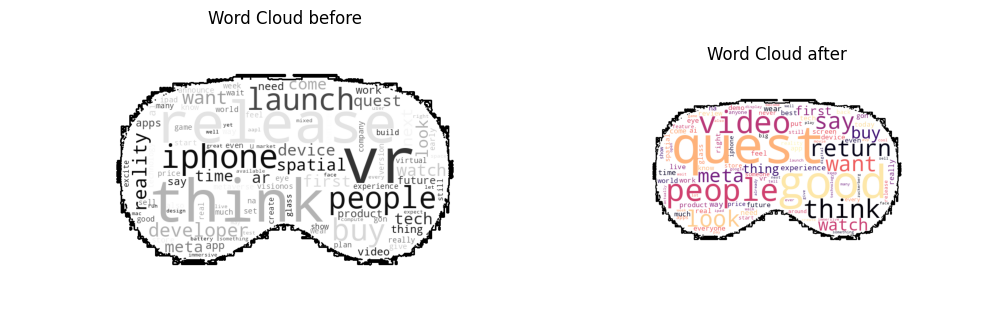

In [ ]:
compare_word_clouds(freq_dist_before, freq_dist_after)

Building a word cloud with 4414 unique words...


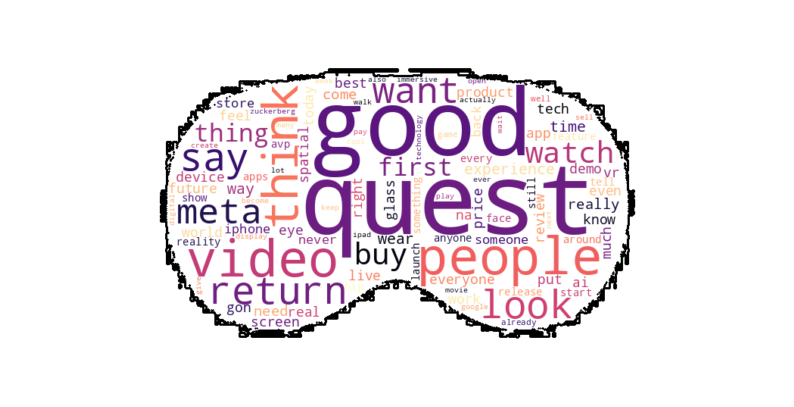

In [ ]:
colormap = 'magma'
fig, ax = plt.subplots(figsize=(10,10))
draw_wordcloud(freq_dist_after, colormap)

<ipython-input-23-4f4800cb198d>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  all_plot = sns.barplot(x=fdist_before.index, y=fdist_before.values, ax=ax, palette='binary')


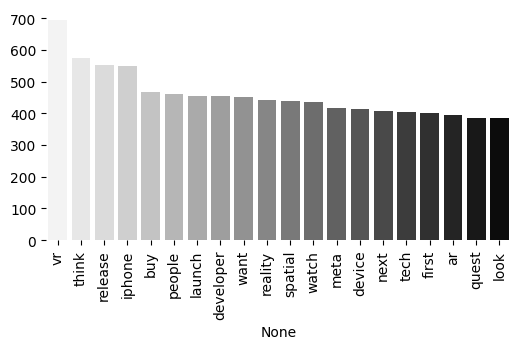

In [ ]:
fdist_before = pd.Series(dict(freq_dist_before.most_common(20)))

fig, ax = plt.subplots(figsize=(6,3))
all_plot = sns.barplot(x=fdist_before.index, y=fdist_before.values, ax=ax, palette='binary')
plt.xticks(rotation=90)
sns.despine(bottom = True, left = True);

<ipython-input-24-c74535946e73>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  all_plot = sns.barplot(x=fdist_after.index, y=fdist_after.values, ax=ax, palette='magma')


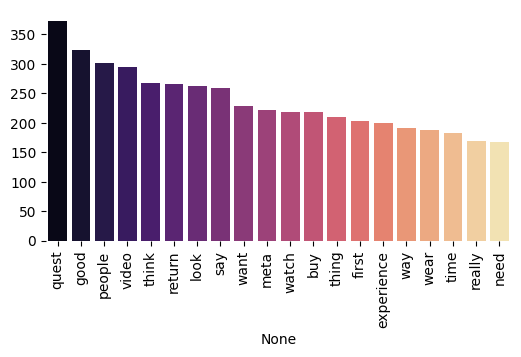

In [ ]:
fdist_after = pd.Series(dict(freq_dist_after.most_common(20)))

fig, ax = plt.subplots(figsize=(6,3))
all_plot = sns.barplot(x=fdist_after.index, y=fdist_after.values, ax=ax, palette='magma')
plt.xticks(rotation=90)
sns.despine(bottom = True, left = True);

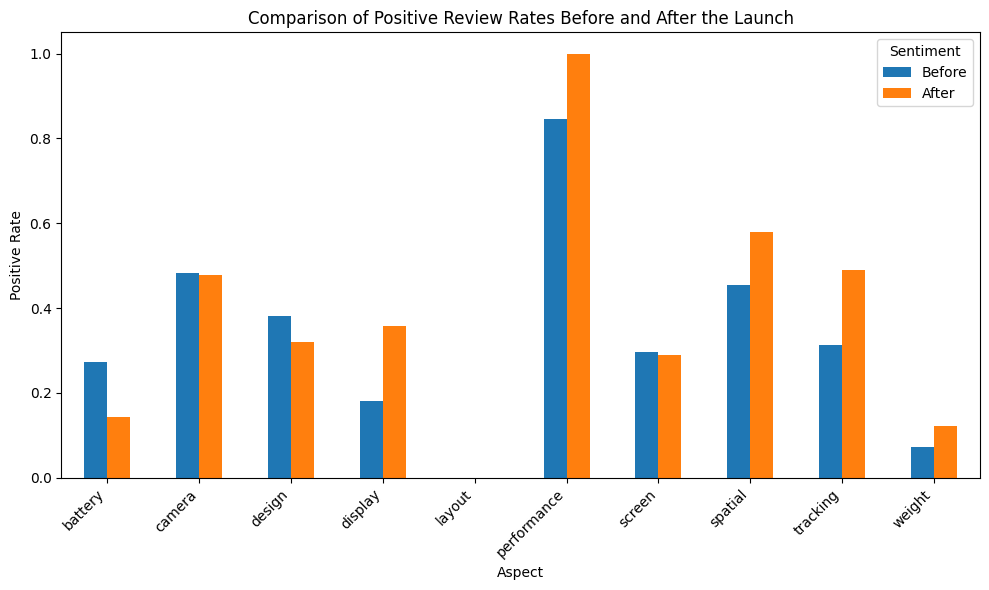

In [ ]:
# Group by aspect and calculate the positive rate
positive_rate_before = sentiment_df_before.groupby('aspect')['label'].apply(lambda x: (x == 'POSITIVE').mean())
positive_rate_after = sentiment_df_after.groupby('aspect')['label'].apply(lambda x: (x == 'POSITIVE').mean())

# Combine dataframes for plotting
combined_df = pd.concat([positive_rate_before, positive_rate_after], axis=1)
combined_df.columns = ['Before', 'After']

# Plotting
combined_df.plot(kind='bar', figsize=(10, 6))
plt.xlabel('Aspect')
plt.ylabel('Positive Rate')
plt.title('Comparison of Positive Review Rates Before and After the Launch')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Sentiment')
plt.tight_layout()
plt.show()

In [ ]:
from textblob import TextBlob

def analyze_sentiment(text):
    blob = TextBlob(text)
    sentiment_score = blob.sentiment.polarity
    if sentiment_score > 0:
        return 1
    elif sentiment_score < 0:
        return 0
    else:
        return None

df1['Sentiment'] = df1['Tweet'].apply(analyze_sentiment)
df_negative = df1[df1.Sentiment == 0]
df_positive = df1[df1.Sentiment == 1]
df_total = df1.groupby('Date').agg({"Tweet" : "count"}).reset_index()

df_pos = df_positive.groupby('Date').agg({"Sentiment" : "count"}).reset_index()
df_neg = df_negative.groupby('Date').agg({"Sentiment" : "count"}).reset_index()

df_last = pd.merge(df_total,df_pos, how ='left', on = 'Date')

df_tot= pd.merge(df_pos, df_neg, how = 'left', on = 'Date')
median_value = df_tot['Sentiment_y'].median()
df_tot['Sentiment_y'].fillna(median_value, inplace=True)

rolling_mean_y = df_tot['Sentiment_y'].rolling(window=5).mean()
rolling_mean_x = df_tot['Sentiment_x'].rolling(window=5).mean()

df_last['ratio'] = df_last['Sentiment']/ df_last['Tweet']
df_last = df_last[df_last.ratio.isnull() == False]

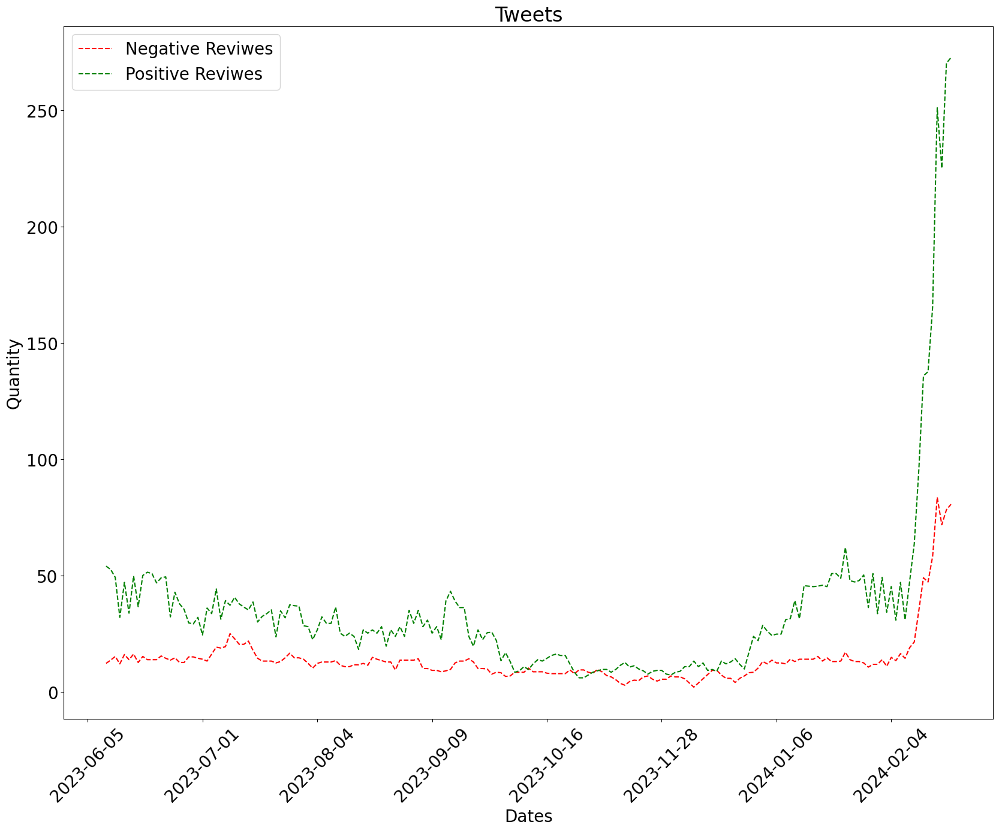

In [ ]:
plt.figure(figsize=(20, 15))

plt.plot(df_tot['Date'].values, rolling_mean_y.values, label='Negative Reviwes', color='Red', linestyle='--')
plt.plot(df_tot['Date'].values, rolling_mean_x.values, label='Positive Reviwes', color='Green', linestyle='--')
plt.legend()

plt.title('Tweets')
plt.xlabel('Dates')
plt.ylabel('Quantity')
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(10))
plt.show()

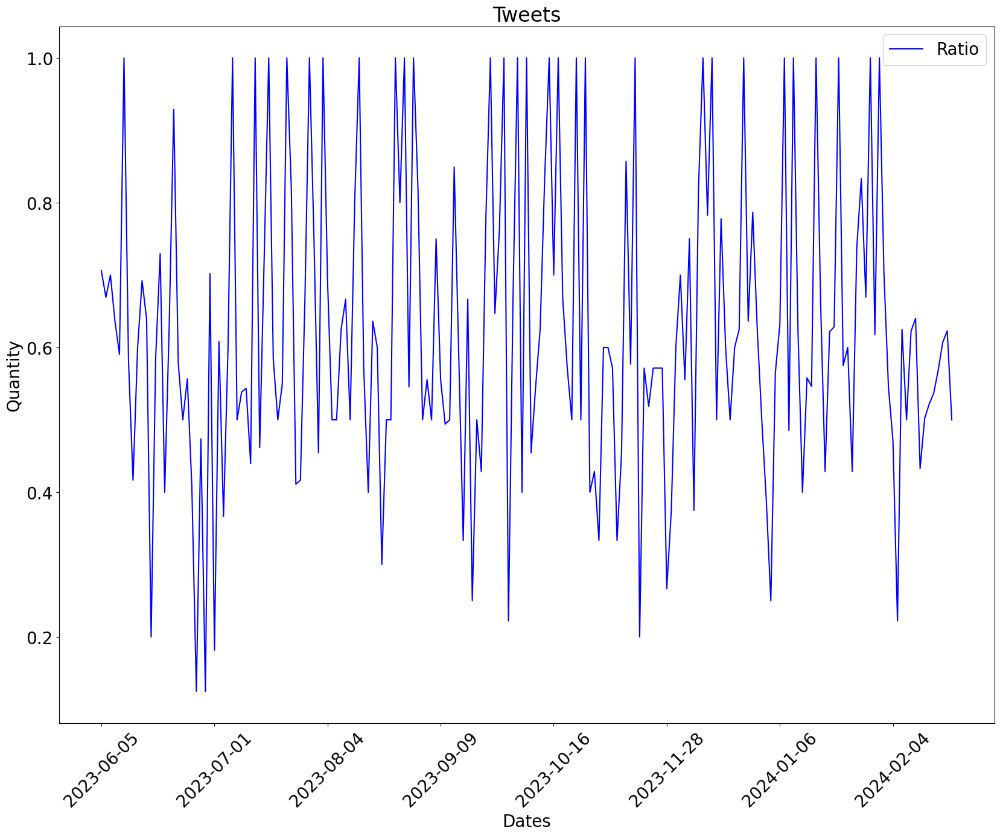

In [ ]:
plt.figure(figsize=(20, 15))
plt.rcParams.update({'font.size': 20})

plt.plot(df_last['Date'].values, df_last['ratio'].values, label='Ratio', color='blue', linestyle='-')
plt.legend()

plt.title('Tweets')
plt.xlabel('Dates')
plt.ylabel('Quantity')
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_locator(plt.MaxNLocator(10))
plt.show()

In [ ]:
#Import
!pip3 install nltk
import re
import nltk
import string
import numpy as np
import random
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%matplotlib notebook
from plotly import graph_objs as go
import plotly.express as px
import plotly.figure_factory as ff
from collections import Counter
from nltk.sentiment import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
!pip3 install palettable

import nltk
from nltk.corpus import stopwords

from tqdm import tqdm
import os
import nltk
import spacy
import random
from spacy.util import compounding
from spacy.util import minibatch

import warnings
warnings.filterwarnings("ignore")

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [ ]:
tweets = pd.read_csv('tweets_output.csv')

In [ ]:
# Cleaning
def clean_text(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = str(text).lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text

tweets['Tweet'] = tweets['Tweet'].apply(lambda x:clean_text(x))
tweets['temp_list'] = tweets['Tweet'].apply(lambda x:str(x).split())
top = Counter([item for sublist in tweets['temp_list'] for item in sublist])
temp = pd.DataFrame(top.most_common(10))
temp.columns = ['Common_words','count']
temp.style.background_gradient(cmap='Blues')

,Common_words,count
0,the,15774
1,apple,12478
2,vision,12468
3,pro,10931
4,to,8574
5,a,6996
6,and,5891
7,is,5414
8,of,5085
9,i,4752


In [ ]:
# Stopwords
from nltk.corpus import stopwords

import nltk
nltk.download('stopwords')

# Get the list of English stopwords
english_stopwords = stopwords.words('english')
spec_names = ['apple', 'vision', 'pro', 'headset', 'applevisionpro','apples']
spec_verbs = ['like', 'get', 'use', 'make', 'go', 'see', 'try', 'could', 'would','take','think','know','going','want']
spec_words = ['year', 'new','one','day','thing','gon','na','wan','ca','right','lot','also','two','people',"i'm","it's"]
english_stopwords.extend(spec_names)
english_stopwords.extend(spec_verbs)
english_stopwords.extend(spec_words)

def remove_stopword(x):
    return [y for y in x if y not in english_stopwords]

tweets['temp_list'] = tweets['temp_list'].apply(lambda x:remove_stopword(x))

top = Counter([item for sublist in tweets['temp_list'] for item in sublist])
temp = pd.DataFrame(top.most_common(10))
temp = temp.iloc[1:,:]
temp.columns = ['Common_words','count']
temp.style.background_gradient(cmap='Purples')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,Common_words,count
1,quest,762
2,iphone,676
3,first,617
4,meta,616
5,tech,551
6,really,510
7,reality,499
8,time,496
9,it’s,494


In [ ]:
fig = px.bar(temp, x="count", y="Common_words", title='Most Commmon Words', orientation='h',
             width=700, height=700,color='Common_words')
fig.show()

In [ ]:
# NLTK SENTIMENT ANALYSIS
tweets['Tweet'] = tweets['Tweet'].astype(str)  # Convert to string in case some entries are not strings

sia = SentimentIntensityAnalyzer()

# Function to get sentiment scores and labels
def get_sentiment(tweet):
    sentiment_scores = sia.polarity_scores(tweet)

    # Determine sentiment label based on compound score
    if sentiment_scores['compound'] >= 0.05:
        return 'Positive'
    elif sentiment_scores['compound'] <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'


tweets['sentiment'] = tweets['Tweet'].apply(get_sentiment)

tweets.head(5)

,Tweet Text,Date,User,Tweet,temp_list,sentiment,Month
0,"Ramp Capital\n@RampCapitalLLC\n·\nJun 6, 2023\...",2023-06-06,@RampCapitalLLC,men will spend on upper deck taylor swift tic...,"[men, spend, upper, deck, taylor, swift, ticke...",Positive,2023-06
1,"mert | helius.dev\n@0xMert_\n·\nJun 6, 2023\nA...",2023-06-06,@0xMert_,apple vision pro was announced today and is ab...,"[announced, today, change, future, computing, ...",Positive,2023-06
2,"Princess\n@CABALCROWN\n·\nJun 6, 2023\nWill th...",2023-06-06,@CABALCROWN,will the apple vision pro help me see his red,"[help, red]",Positive,2023-06
3,"C.J. Prince\n@cj_prin\n·\nJun 6, 2023\nWatchin...",2023-06-06,@cj_prin,watching martin scorseses killers of the flowe...,"[watching, martin, scorseses, killers, flower,...",Negative,2023-06
4,"Christoph Nakazawa\n@cpojer\n·\nJun 6, 2023\nT...",2023-06-06,@cpojer,the vision pro announcement is great for meta ...,"[announcement, great, meta, validated, meta, o...",Positive,2023-06


In [ ]:
tweets['Date'] = pd.to_datetime(tweets['Date'])
tweets['Month'] = tweets['Date'].dt.to_period('M')

agg_tweets = tweets.groupby(['Month', 'sentiment']).size().unstack(fill_value=0)

agg_tweets.plot(kind='line', marker='o')

plt.xlabel('Date')
plt.ylabel('Count')
plt.title('Sentiment Analysis Over Time')

plt.legend(title='Sentiment')

plt.xticks(rotation=45)

plt.show()

<IPython.core.display.Javascript object>

In [ ]:
jan_feb = tweets[tweets['Date'] >= '2024-01-01']
jan_feb = jan_feb.groupby(['Date', 'sentiment']).size().unstack(fill_value=0)

jan_feb.plot(kind='line', marker='o')

plt.xlabel('Date')
plt.ylabel('Count')
plt.title('Sentiment Analysis Over Time')

plt.legend(title='Sentiment')

vertical_line_date = '2024-02-02'
plt.axvline(x=vertical_line_date, color='red', linestyle='--', label='Vertical Line')

plt.xticks(rotation=45)

plt.show()

<IPython.core.display.Javascript object>

In [ ]:
# Create subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

# Plot the first line chart
agg_tweets.plot(kind='line', marker='o', ax=ax1)

ax1.set_ylabel('Count')
ax1.set_title('Sentiment Analysis Over Time (Aggregated)')

ax1.legend(title='Sentiment')
ax1.tick_params(axis='x', rotation=45)

# Plot the second line chart
jan_feb.plot(kind='line', marker='o', ax=ax2)

ax2.set_xlabel('Date')
ax2.set_ylabel('Count')
ax2.set_title('Sentiment Analysis Over Time (January and February)')

ax2.legend(title='Sentiment')

# Add a vertical line to both subplots
vertical_line_date = '2024-02-02'
ax1.axvline(x=vertical_line_date, color='red', linestyle='--', label='Vertical Line')
ax2.axvline(x=vertical_line_date, color='red', linestyle='--', label='Vertical Line')

# Show the plots
plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>

In [ ]:
# SENTIMENT-WORDS ANALYSIS
Positive_sent = tweets[tweets['sentiment']=='Positive']
Negative_sent = tweets[tweets['sentiment']=='Negative']
Neutral_sent = tweets[tweets['sentiment']=='Neutral']

In [ ]:
top = Counter([item for sublist in Positive_sent['temp_list'] for item in sublist])
temp_positive = pd.DataFrame(top.most_common(10))
temp_positive.columns = ['Common_words','count']
temp_positive.style.background_gradient(cmap='Greens')

,Common_words,count
0,vr,703
1,quest,677
2,meta,546
3,iphone,515
4,first,513
5,tech,451
6,time,444
7,ai,437
8,spatial,437
9,reality,435


In [ ]:
fig = px.bar(temp_positive, x="count", y="Common_words", title='Most Commmon Positive Words', orientation='h',
             width=700, height=700,color='Common_words')

fig.show(renderer='notebook')

In [ ]:
raw_text = [word for word_list in tweets['temp_list'] for word in word_list]

In [ ]:
def words_unique(sentiment,numwords,raw_words):

    allother = []
    for item in tweets[tweets.sentiment != sentiment]['temp_list']:
        for word in item:
            allother .append(word)
    allother  = list(set(allother ))

    specificnonly = [x for x in raw_text if x not in allother]

    mycounter = Counter()

    for item in tweets[tweets.sentiment == sentiment]['temp_list']:
        for word in item:
            mycounter[word] += 1
    keep = list(specificnonly)

    for word in list(mycounter):
        if word not in keep:
            del mycounter[word]

    Unique_words = pd.DataFrame(mycounter.most_common(numwords), columns = ['words','count'])

    return Unique_words

In [ ]:
Unique_Positive= words_unique('Positive', 10, raw_text)

In [ ]:
from palettable.colorbrewer.qualitative import Pastel1_7
plt.figure(figsize=(7,7))
my_circle=plt.Circle((0,0), 0.7, color='white')
plt.pie(Unique_Positive['count'], labels=Unique_Positive.words, colors=Pastel1_7.hex_colors)
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title('Donut Plot Of Unique Positive Words')
plt.show()

<IPython.core.display.Javascript object>

In [ ]:
# Negative segment
top = Counter([item for sublist in Negative_sent['temp_list'] for item in sublist])
temp_negative = pd.DataFrame(top.most_common(10))
temp_negative.columns = ['Common_words','count']
temp_negative.style.background_gradient(cmap='Reds')

,Common_words,count
0,vr,134
1,got,120
2,iphone,102
3,shit,98
4,it’s,97
5,tech,91
6,gonna,79
7,app,78
8,really,74
9,first,74


In [ ]:
fig = px.bar(temp_negative, x="count", y="Common_words", title='Most Commmon Negative Words', orientation='h',
             width=700, height=700,color='Common_words')

fig.show(renderer='notebook')

In [ ]:
Unique_Negative= words_unique('Negative', 10, raw_text)

In [ ]:
from palettable.colorbrewer.qualitative import Pastel1_7
plt.figure(figsize=(7,7))
my_circle=plt.Circle((0,0), 0.7, color='white')
plt.pie(Unique_Negative['count'], labels=Unique_Negative.words, colors=Pastel1_7.hex_colors)
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title('DoNut Plot Of Unique Negative Words')
plt.show()

<IPython.core.display.Javascript object>

### Youtube content

In [ ]:
df2 = pd.read_csv('youtube.csv')

In [ ]:
df2.shape

(12, 3)

In [ ]:
df2.head(12)

,content,date,creator
0,"Intro\n (upbeat music)\n - Okay, I've used the...","Jun 6, 2023",Marques Brownlee
1,"Intro\n (upbeat music) - All right, so you've ...","Jan 31, 2024",Marques Brownlee
2,this is the Apple Vision Pro headset it\n star...,"Jun 6, 2023",Mrwhosetheboss
3,this is the Apple Vision Pro if you\n haven't ...,"Feb 9, 2024",Ryan Trahan
4,"(bright music)\n - All right, it's finally her...","Jan 30, 2024",Marques Brownlee
5,Intro\n - I actually love this thing.\n I love...,"Feb 4, 2024",Marques Brownlee
6,like what that's wild like real yeah I\n mean ...,"Feb 3, 2024",CaseyNeistat
7,"The Apple Vision Pro.\n Not going to lie, when...","Feb 6, 2024",JerryRigEverything
8,(lively music)\n - Is this another Vision Pro ...,"Feb 13, 2024",Marques Brownlee
9,Apple’s headset\n - You've heard all about it....,"Jan 30, 2024",The Wall Street Journal


In [ ]:
df2_0 = df2.loc[df2['date'] < 'Feb 2, 2024', 'content'].str.capitalize() + '.'
df2_1 = df2.loc[df2['date'] >= 'Feb 2, 2024', 'content'].str.capitalize() + '.'

In [ ]:
MB_jun6 = df2.loc[[0], 'content'].str.capitalize() + '.'
MB_jan30 = df2.loc[[4], 'content'].str.capitalize() + '.'
MB_jan31 = df2.loc[[1], 'content'].str.capitalize() + '.'
MB_feb4 = df2.loc[[5], 'content'].str.capitalize() + '.'
MB_feb13 = df2.loc[[8], 'content'].str.capitalize() + '.'

In [ ]:
text_before = ''
text_after = ''

for line in df2_0:
    text_before += str(line).replace('\n', '')
for line in df2_1:
    text_after += str(line).replace('\n', '')

In [ ]:
text_MB_jun6 = ''
text_MB_jan30 = ''
text_MB_jan31 = ''
text_MB_feb4 = ''
text_MB_feb13 = ''

for line in MB_jun6:
    text_MB_jun6 += str(line).replace('\n', '')
for line in MB_jan30:
    text_MB_jan30 += str(line).replace('\n', '')
for line in MB_jan31:
    text_MB_jan31 += str(line).replace('\n', '')
for line in MB_feb4:
    text_MB_feb4 += str(line).replace('\n', '')
for line in MB_feb13:
    text_MB_feb13 += str(line).replace('\n', '')


In [ ]:
freq_dist_before = text_to_lemma_frequencies(text_before)
freq_dist_after = text_to_lemma_frequencies(text_after)

In [ ]:
freq_dist_MB_jun6 = text_to_lemma_frequencies(text_MB_jun6)
freq_dist_MB_jan30 = text_to_lemma_frequencies(text_MB_jan30)
freq_dist_MB_jan31 = text_to_lemma_frequencies(text_MB_jan31)
freq_dist_MB_feb4 = text_to_lemma_frequencies(text_MB_feb4)
freq_dist_MB_feb13 = text_to_lemma_frequencies(text_MB_feb13)

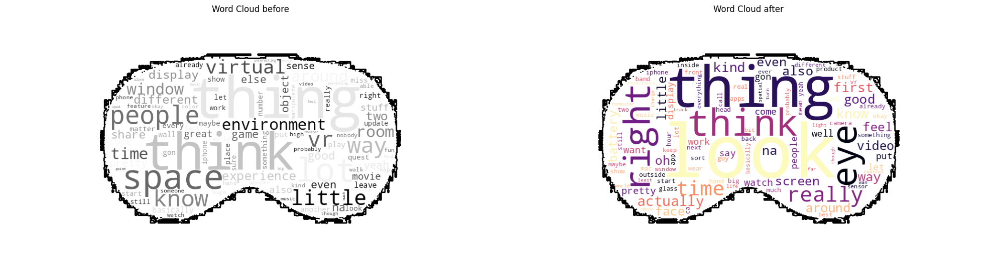

In [ ]:
wordcloud1 = WordCloud(colormap='binary', width=6000, height=6000, max_words=100, background_color='white', font_step=1, mode='RGB', mask = mask,
               contour_width = 3).generate_from_frequencies(freq_dist_before)
wordcloud2 = WordCloud(colormap='magma', width=6000, height=6000, max_words=100, background_color='white', font_step=1, mode='RGB', mask = mask,
               contour_width = 3).generate_from_frequencies(freq_dist_after)

plt.figure(figsize=(20, 10))
plt.subplot(1,2,1)
plt.imshow(wordcloud1)
plt.axis('off')
plt.title('Word Cloud before')

plt.subplot(1,2,2)
plt.imshow(wordcloud2)
plt.axis('off')
plt.title('Word Cloud after')

plt.tight_layout()

plt.show()

<ipython-input-38-4f4800cb198d>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  all_plot = sns.barplot(x=fdist_before.index, y=fdist_before.values, ax=ax, palette='binary')


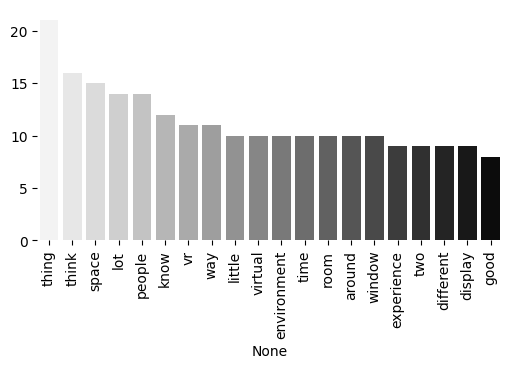

In [ ]:
fdist_before = pd.Series(dict(freq_dist_before.most_common(20)))

fig, ax = plt.subplots(figsize=(6,3))
all_plot = sns.barplot(x=fdist_before.index, y=fdist_before.values, ax=ax, palette='binary')
plt.xticks(rotation=90)
sns.despine(bottom = True, left = True);

<ipython-input-39-c74535946e73>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  all_plot = sns.barplot(x=fdist_after.index, y=fdist_after.values, ax=ax, palette='magma')


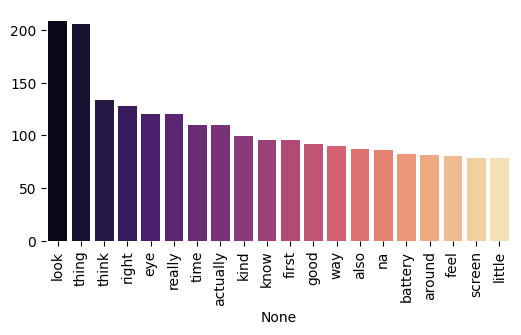

In [ ]:
fdist_after = pd.Series(dict(freq_dist_after.most_common(20)))

fig, ax = plt.subplots(figsize=(6,3))
all_plot = sns.barplot(x=fdist_after.index, y=fdist_after.values, ax=ax, palette='magma')
plt.xticks(rotation=90)
sns.despine(bottom = True, left = True);

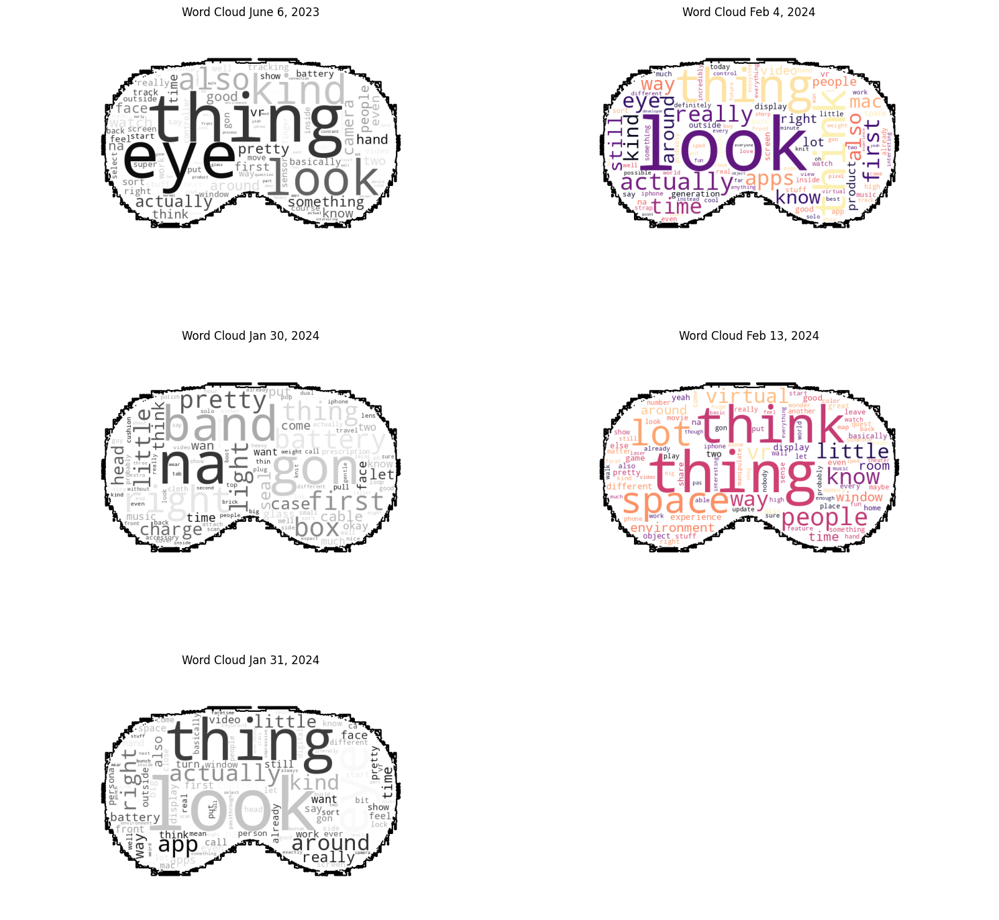

In [ ]:
wordcloud1 = WordCloud(colormap='binary', width=6000, height=6000, max_words=100, background_color='white', font_step=1, mode='RGB', mask = mask,
               contour_width = 3).generate_from_frequencies(freq_dist_MB_jun6)
wordcloud2 = WordCloud(colormap='binary', width=6000, height=6000, max_words=100, background_color='white', font_step=1, mode='RGB', mask = mask,
               contour_width = 3).generate_from_frequencies(freq_dist_MB_jan30)
wordcloud3 = WordCloud(colormap='binary', width=6000, height=6000, max_words=100, background_color='white', font_step=1, mode='RGB', mask = mask,
               contour_width = 3).generate_from_frequencies(freq_dist_MB_jan31)
wordcloud4 = WordCloud(colormap='magma', width=6000, height=6000, max_words=100, background_color='white', font_step=1, mode='RGB', mask = mask,
               contour_width = 3).generate_from_frequencies(freq_dist_MB_feb4)
wordcloud5 = WordCloud(colormap='magma', width=6000, height=6000, max_words=100, background_color='white', font_step=1, mode='RGB', mask = mask,
               contour_width = 3).generate_from_frequencies(freq_dist_MB_feb13)

plt.figure(figsize=(15,15))
plt.subplot(3, 2, 1)
plt.imshow(wordcloud1)
plt.axis('off')
plt.title('Word Cloud June 6, 2023')

plt.subplot(3, 2, 3)
plt.imshow(wordcloud2)
plt.axis('off')
plt.title('Word Cloud Jan 30, 2024')

plt.subplot(3, 2, 5)
plt.imshow(wordcloud3)
plt.axis('off')
plt.title('Word Cloud Jan 31, 2024')

plt.subplot(3, 2, 2)
plt.imshow(wordcloud4)
plt.axis('off')
plt.title('Word Cloud Feb 4, 2024')

plt.subplot(3, 2, 4)
plt.imshow(wordcloud5)
plt.axis('off')
plt.title('Word Cloud Feb 13, 2024')

plt.tight_layout()

plt.show()

In [ ]:
from textblob import TextBlob

def analyze_sentiment(text):
    blob = TextBlob(text)
    sentiment_score = blob.sentiment.polarity
    return sentiment_score

# Add a column 'Sentiment'
df2['Sentiment'] = df2['content'].apply(analyze_sentiment)

print(df2)

                                              content          date  \
0   Intro\n (upbeat music)\n - Okay, I've used the...   Jun 6, 2023   
1   Intro\n (upbeat music) - All right, so you've ...  Jan 31, 2024   
2   this is the Apple Vision Pro headset it\n star...   Jun 6, 2023   
3   this is the Apple Vision Pro if you\n haven't ...   Feb 9, 2024   
4   (bright music)\n - All right, it's finally her...  Jan 30, 2024   
5   Intro\n - I actually love this thing.\n I love...   Feb 4, 2024   
6   like what that's wild like real yeah I\n mean ...   Feb 3, 2024   
7   The Apple Vision Pro.\n Not going to lie, when...   Feb 6, 2024   
8   (lively music)\n - Is this another Vision Pro ...  Feb 13, 2024   
9   Apple’s headset\n - You've heard all about it....  Jan 30, 2024   
10  Intro\n - Apple just demolished (whistling)\n ...   Jun 6, 2023   
11  It's been hard to avoid this...\n while I have...   Feb 9, 2024   

                    creator  Sentiment  
0          Marques Brownlee   0.184

<ipython-input-42-f59d83517c4b>:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('RdBu_r')


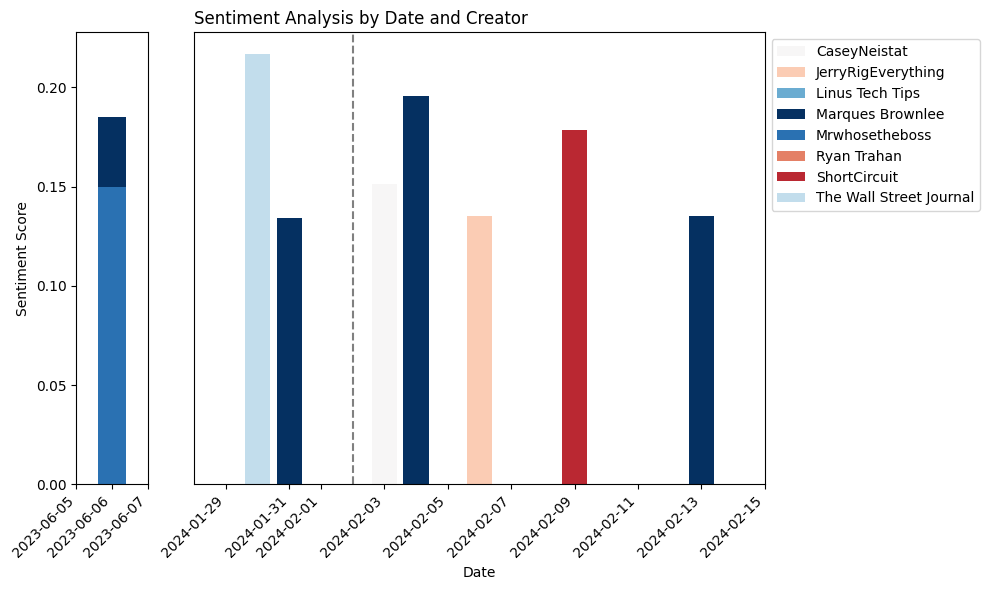

In [ ]:
#Plotting the sentiment scores group by creators and order by date
import matplotlib.cm as cm
import matplotlib.dates as mdates
plt.figure(figsize=(10, 6))

df2['date'] = pd.to_datetime(df2['date'])   #Convert 'date' column to datetime format
df2 = df2.sort_values(by='date')  #Sort DataFrame by 'date'
unique_creators = df2['creator'].unique()  #Get unique creators


cmap = cm.get_cmap('RdBu_r')
colors = [cmap(i / len(unique_creators)) for i in range(len(unique_creators))]
creator_color_dict = dict(zip(unique_creators, colors))

gs = gridspec.GridSpec(1, 2, width_ratios=[1,8])
plt.subplot(gs[0])

for creator, group in df2.groupby('creator'):   #Group by creator
    plt.bar(group['date'], group['Sentiment'], label=creator, color=creator_color_dict[creator])
plt.ylabel('Sentiment Score')

plt.xticks(rotation=45, ha='right')
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.xlim(pd.to_datetime('Jun 5, 2023'), pd.to_datetime('Jun 7, 2023'))


plt.subplot(gs[1])
for creator, group in df2.groupby('creator'):
    plt.bar(group['date'], group['Sentiment'], label=creator, color=creator_color_dict[creator])
plt.xlabel('Date')
plt.xticks(rotation=45, ha='right')
plt.axvline(x=pd.to_datetime('Feb 2, 2024'), color='gray', linestyle='--')
plt.xlim(pd.to_datetime('Jan 28, 2024'), pd.to_datetime('Feb 15, 2024'))
plt.legend(loc='upper left', bbox_to_anchor=(1,1))
plt.title('Sentiment Analysis by Date and Creator',loc = 'left')
plt.yticks([])


plt.tight_layout()
plt.show()


In [ ]:
#Sentiment analysis seperated on aspects for Youtube content

sentiment_df_after = pd.DataFrame(columns=['aspect', 'label', 'score'])

for reviews in df2_1:
  for chunks in divide_text_into_chunks(reviews):
    mentioned_aspects = extract_aspects(chunks)
    aspect_sentiments = analyze_aspect_sentiments(chunks, mentioned_aspects)
    for aspect, sentiment in aspect_sentiments.items():
                sentiment_df_after = sentiment_df_after.append({
                    'aspect': aspect,
                    'label': sentiment['label'],
                    'score': sentiment['score']},
                    ignore_index=True
                )


sentiment_df_before = pd.DataFrame(columns=['aspect', 'label', 'score'])

for reviews in df2_0:
  for chunks in divide_text_into_chunks(reviews):
    mentioned_aspects = extract_aspects(chunks)
    aspect_sentiments = analyze_aspect_sentiments(chunks, mentioned_aspects)
    for aspect, sentiment in aspect_sentiments.items():
                sentiment_df_before = sentiment_df_before.append({
                    'aspect': aspect,
                    'label': sentiment['label'],
                    'score': sentiment['score']},
                    ignore_index=True)

In [ ]:
# Group by aspect and calculate the positive rate
positive_rate_before = sentiment_df_before.groupby('aspect')['label'].apply(lambda x: (x == 'POSITIVE').mean())
positive_rate_after = sentiment_df_after.groupby('aspect')['label'].apply(lambda x: (x == 'POSITIVE').mean())

# Combine dataframes for plotting
combined_df = pd.concat([positive_rate_before, positive_rate_after], axis=1)
combined_df.columns = ['Before', 'After']

# Plotting
combined_df.plot(kind='bar', figsize=(10, 6))
plt.xlabel('Aspect')
plt.ylabel('Positive Rate')
plt.title('Comparison of Positive Review Rates Before and After the Launch')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Sentiment')
plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>

### Articles

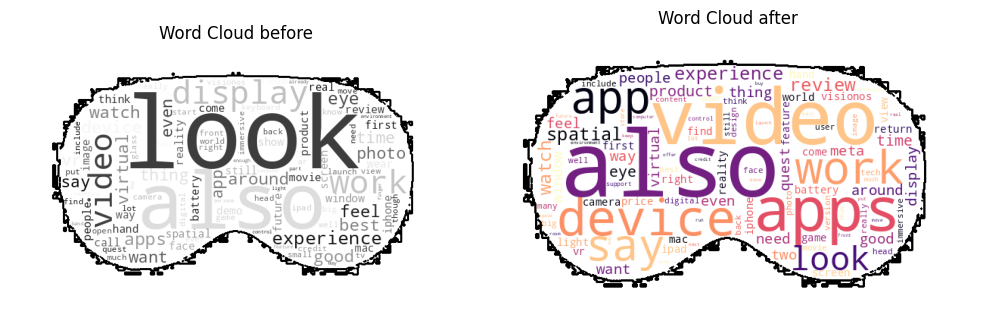

In [ ]:
#We create one dataframe for all the data from articles before and after the launch of the headset and apply the workcloud
reviews_before_release=df_pre_release['content']
reviews_after_release=df_post_release['content']

reviews_before_release=str()
for i in range(len(df_pre_release['content'])):
    reviews_before_release+=df_pre_release['content'][i]

reviews_after_release=str()
for i in range(len(df_post_release['content'])):
    reviews_after_release+=df_post_release['content'][i]

freq_dist_before = text_to_lemma_frequencies(reviews_before_release)
freq_dist_after = text_to_lemma_frequencies(reviews_after_release)
compare_word_clouds(freq_dist_before, freq_dist_after)

<ipython-input-42-23073f361801>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features_sentiment_before['rate']=1
<ipython-input-42-23073f361801>:4: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  features_sentiment_before=features_sentiment_before.groupby(["aspect",'label']).sum()['rate']/(features_sentiment_before.groupby(["aspect"]).sum()['rate'])
<ipython-input-42-23073f361801>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the do

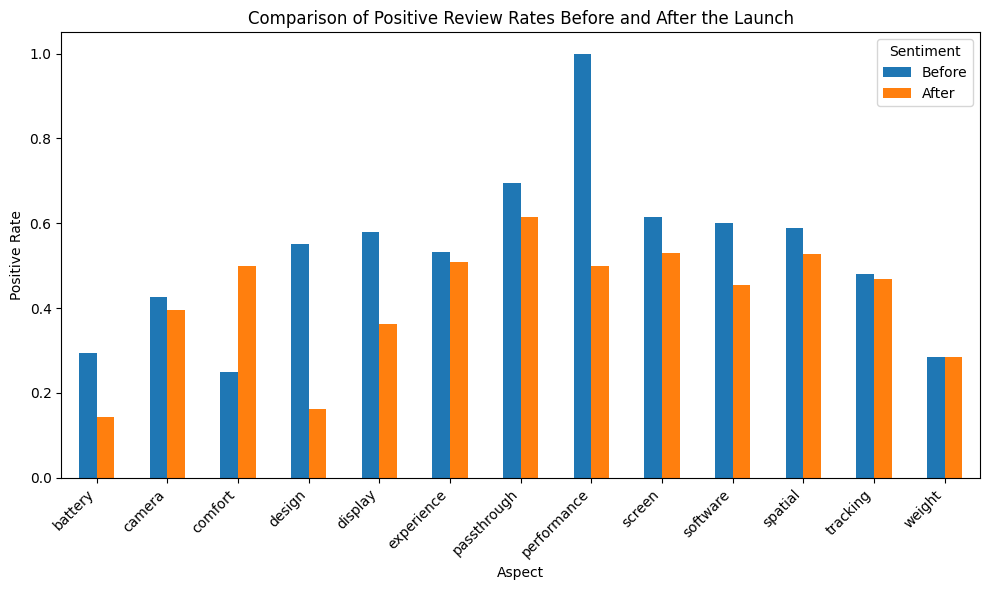

In [ ]:
features_sentiment_before=sentiment_df_before[sentiment_df_before['score']>0.8] #we will analyse only statements we are confident on their assessement
#we compute the satisfaction rate per aspect
features_sentiment_before['rate']=1
features_sentiment_before=features_sentiment_before.groupby(["aspect",'label']).sum()['rate']/(features_sentiment_before.groupby(["aspect"]).sum()['rate'])
features_sentiment_before=features_sentiment_before.reset_index()
features_sentiment_before_positive=features_sentiment_before[features_sentiment_before['label']=='POSITIVE'].drop(axis=1,columns='label').set_index('aspect')
features_sentiment_before_negative=features_sentiment_before[features_sentiment_before['label']=='NEGATIVE']

features_sentiment_after=sentiment_df_after[sentiment_df_after['score']>0.8]
features_sentiment_after['rate']=1
features_sentiment_after=features_sentiment_after.groupby(["aspect",'label']).sum()['rate']/(features_sentiment_after.groupby(["aspect"]).sum()['rate'])
features_sentiment_after=features_sentiment_after.reset_index()
features_sentiment_after_positive=features_sentiment_after[features_sentiment_after['label']=='POSITIVE'].drop(axis=1,columns='label').set_index('aspect')
features_sentiment_after_negative=features_sentiment_after[features_sentiment_after['label']=='NEGATIVE']

combined_df = pd.concat([features_sentiment_before_positive, features_sentiment_after_positive], axis=1)
combined_df.columns = ['Before', 'After']

# Plotting
combined_df.plot(kind='bar', figsize=(10, 6))
plt.xlabel('Aspect')
plt.ylabel('Positive Rate')
plt.title('Comparison of Positive Review Rates Before and After the Launch')
plt.xticks(rotation=45, ha='right')
plt.legend(title='Sentiment')
plt.tight_layout()
plt.show()